# Python Project 1: Stock Data Analysis with Pandas and Plotly

**Author**: Chinh X. Mai, **Date**: June 28, 2022

## Case description

Considering a hypothetical scenario, where I want to learn to invest in the stock market. To simplify the choices of stock I have to make, I will only consider the stocks in the DAX30 Index, as they are the major German blue chip companies trading on the Frankfurt Stock Exchange. The 10 components of the DAX30 index are listed in the table below

| Symbol  | Company Name                                | Last Price | Change | % Change | Volume     |
| ------- | ------------------------------------------- | ---------- | ------ | -------- | ---------- |
| SY1.DE  | Symrise AG                                  | 106.25     | 0.05   | 0.05%    | 277,156    |
| ALV.DE  | Allianz SE                                  | 181.04     | \-0.16 | \-0.09%  | 1,069,053  |
| MRK.DE  | MERCK Kommanditgesellschaft auf Aktien      | 165.1      | 0.3    | 0.18%    | 313,644    |
| DTE.DE  | Deutsche Telekom AG                         | 18.84      | \-0.04 | \-0.20%  | 6,880,550  |
| VOW3.DE | Volkswagen AG                               | 138.88     | \-0.3  | \-0.22%  | 913,070    |
| DBK.DE  | Deutsche Bank Aktiengesellschaft            | 8.89       | \-0.03 | \-0.33%  | 10,112,593 |
| HNR1.DE | Hannover Rück SE                            | 136.4      | \-0.45 | \-0.33%  | 95,892     |
| HEI.DE  | HeidelbergCement AG                         | 48.78      | 0.29   | 0.60%    | 623,977    |
| 1COV.DE | Covestro AG                                 | 34.26      | \-0.22 | \-0.64%  | 982,911    |
| BEI.DE  | Beiersdorf Aktiengesellschaft               | 98.62      | 0.64   | 0.65%    | 246,097    |

**Table 1**: 10 Components of the DAX PERFORMANCE-INDEX (source: [Yahoo! Finance](https://finance.yahoo.com/quote/%5EGDAXI/components?p=%5EGDAXI), accessed on June 27, 2022)

These are the stocks that I would like to carry out an exploratory analysis on. As I want to invest in 6 stocks, I expect that the analysis will give me enough insights to select the stocks to form a portfolio and prepare for the optimization.

## Objectives

This project aim to showcase my familiarity with Pandas and Plotly, which are the two powerful packages respectively used to manipulate data and construct interactive plots in Python. Furthermore, I would like to use the tools provided by these packages to study the trends in prices, volatility in returns, and changes in cumulative returns of these stocks. Hence, the detailed analysis will focus on

* using `Pandas` to manipulate stock data to extract useful insights
* utilize `plotly` to construct interactive plots
* investigate trends in stock prices
* study the volatility in stock returns
* visualize the cumulative returns of the chosen stocks

I will also construct many type of plots to visualize stock data, depending on their use cases as well as customize these plots so that they could deliver the intended information.

## Details of the analysis

### Important libraries and default settings

In [1]:
# Data and array manipulation
import pandas as pd
import numpy as np

# Datetime manipulation
import datetime as dt

# Plotting and Visualization
import matplotlib.pyplot as plt
import plotly.express as px
import chart_studio.plotly as py
import cufflinks as cf


# Fetching stock data from web
import pandas_datareader.data as web

# Interactive charts
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected = True)
cf.go_offline()

# Options
pd.options.display.float_format = '{:,.4f}'.format

# Default settings
default_yaxis = dict(showgrid = False,
                     zeroline = False,
                     showline = False,
                     showticklabels = True)
default_RgSlct = dict(buttons = list([dict(count = 1, label = "1 Month", step = "month", stepmode = "backward"),
                                      dict(count = 6, label = "6 Months", step = "month", stepmode = "backward"),
                                      dict(count = 1, label = "1 Year", step = "year", stepmode = "backward"),
                                      dict(count = 1, label = "YTD", step = "year", stepmode = "todate"),
                                      dict(label = "All Data", step = "all")]))

### Reading data

In this project, I will consider the stock data of the last 5 years. This data is fetched easily with `pandas_datareader`.

In [2]:
# Setting the windows of data to be fetched
start = dt.datetime(2017, 6, 28)
end = dt.datetime(2022, 6, 28)

# Listing the tickers of the choen stocks
tickers = ['SY1.DE', 'ALV.DE', 'MRK.DE', 'DTE.DE', 'VOW3.DE', 'DBK.DE', 'HNR1.DE', 'HEI.DE', '1COV.DE', 'BEI.DE']

# Empty Data Frame for combining results
df = pd.DataFrame([])

# Fetching
for _ in tickers:
    temp = web.DataReader(_, 'yahoo', start, end).reset_index()
    temp['Ticker'] = _
    df = pd.concat([df, temp], ignore_index = True)

# combined Data Frame
df

,Date,High,Low,Open,Close,Volume,Adj Close,Ticker
0,2017-06-28,63.5700,62.6600,63.0900,62.7300,"282,906.0000",59.0006,SY1.DE
1,2017-06-29,63.4300,62.0100,63.1400,62.2600,"285,637.0000",58.5585,SY1.DE
2,2017-06-30,63.1100,62.0200,62.2600,62.0200,"332,730.0000",58.3328,SY1.DE
3,2017-07-03,62.9000,62.1400,62.4000,62.4800,"185,066.0000",58.7654,SY1.DE
4,2017-07-04,62.4500,61.7400,62.4200,62.0500,"191,373.0000",58.3610,SY1.DE
...,...,...,...,...,...,...,...,...
12675,2022-06-22,95.6600,93.0600,93.7600,95.2600,"419,458.0000",95.2600,BEI.DE
12676,2022-06-23,97.0600,95.0000,95.3000,96.6800,"502,331.0000",96.6800,BEI.DE
12677,2022-06-24,98.7200,96.7600,97.4800,97.9800,"326,421.0000",97.9800,BEI.DE
12678,2022-06-27,99.2600,98.1600,98.7400,98.6200,"246,097.0000",98.6200,BEI.DE


Each fetched dataset only contains information about `Date` (as the index), `High`, `Low`, `Open`, `Close`, `Volume`, and `Adj Close` of only one stock. The Data Frame here has been modified so that it contains the stock prices of all stocks listed above, as well as the column `Ticker` to show to which the information belong to. This form of presentation allows for convenient operations with the data as I have to investigate a considerable number of stocks simultaneously.

Before going to the details, let us check the Data Frame for any missing value.

In [3]:
# Counting null value throughout the columns
df.isnull().sum()

Date         0
High         0
Low          0
Open         0
Close        0
Volume       0
Adj Close    0
Ticker       0
dtype: int64

and some metadata of the Data Frame.

In [4]:
# check start date, end date, and length of each ticker (ungrouped)
df.groupby('Ticker')['Date'].agg(['min', 'max', 'count'])

,min,max,count
Ticker,,,
1COV.DE,2017-06-28,2022-06-28,1268
ALV.DE,2017-06-28,2022-06-28,1268
BEI.DE,2017-06-28,2022-06-28,1268
DBK.DE,2017-06-28,2022-06-28,1268
DTE.DE,2017-06-28,2022-06-28,1268
HEI.DE,2017-06-28,2022-06-28,1268
HNR1.DE,2017-06-28,2022-06-28,1268
MRK.DE,2017-06-28,2022-06-28,1268
SY1.DE,2017-06-28,2022-06-28,1268


Generally, the fetched data is complete and does not need further cleaning. This is understandable and usually the case for stock data.

### Trend Analysis

Firstly, let us look at the line charts of all the stocks separately, this only gives a rough image of the trends in the changes in these stock prices over the chosen period, but it is a good start to study these trends. I prefer area charts to line charts as their visual effect is stronger for my eyes to realize the magnitude of each stock price compared to those of others.

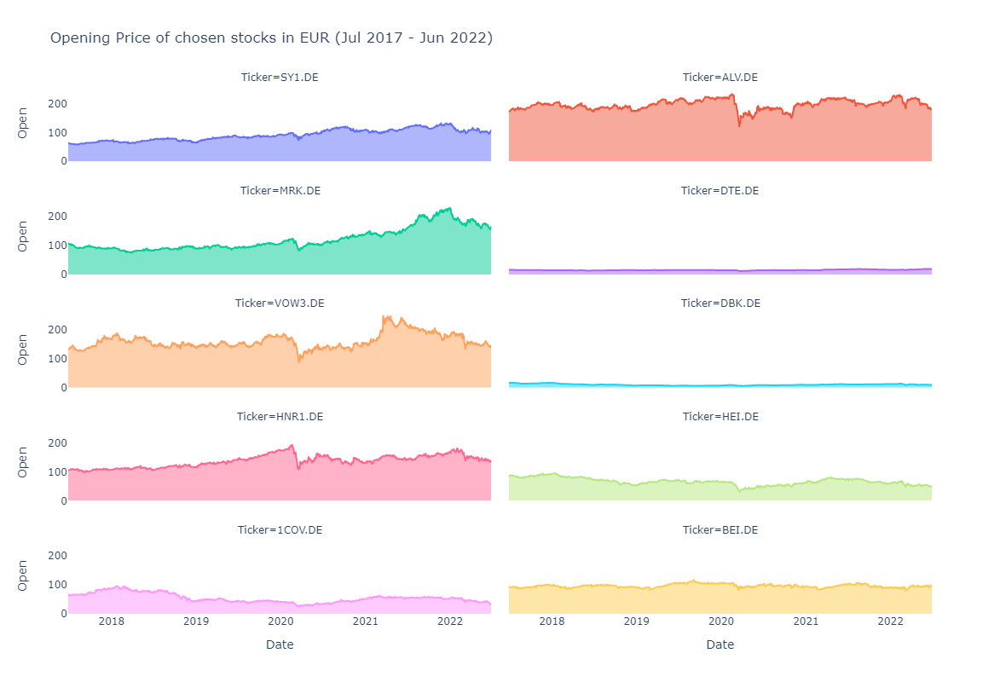

In [5]:
# Individual changes of each stock
fig = px.area(df, 
              x = 'Date',
              y = 'Open',
              facet_col = 'Ticker',
              color = 'Ticker',
              facet_col_wrap = 2, 
              labels = {'x': 'Date', 'y': 'Price'}, 
              title = 'Opening Price of chosen stocks in EUR (Jul 2017 - Jun 2022)',
              width = 1000,
              height = 800)

# Adjusting the layout to reduce clutter
fig.update_layout(yaxis = default_yaxis, showlegend = False, autosize = True, plot_bgcolor = 'white')

# Showing the visualization
fig.show()

As these charts share the same vertical scale, the areas covered by the line charts are comparable. It can be seen that the prices of `DBK.DE` and `DTE.DE` are much lower than those of others over the considered period due to their small covered areas, while the areas covered by `VOW3.DE`, `HNR1.DE`, and `ALV.DE` are much larger comparatively. When put together on the same plot, the difference of magnitude in prices is presented clearly.

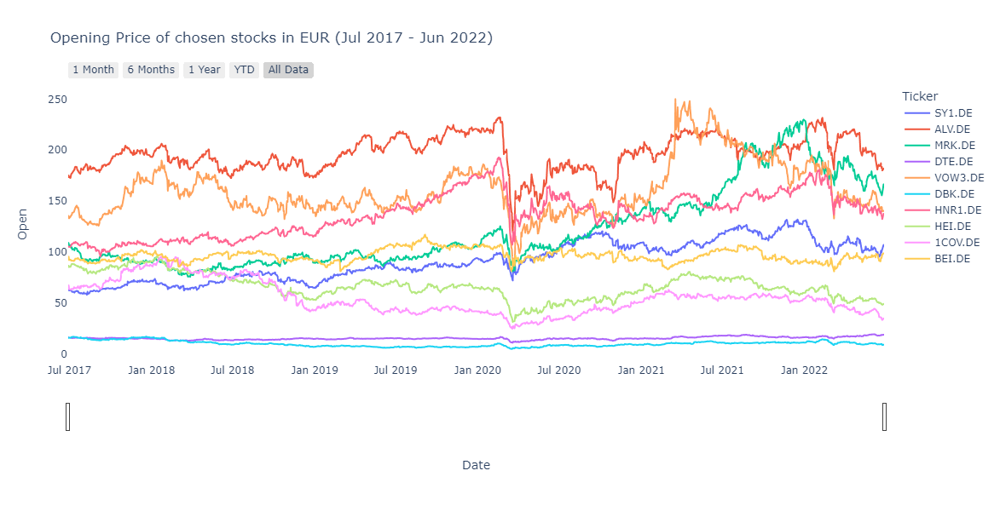

In [6]:
# Creating the basic line chart
fig = px.line(df, 
              x = 'Date',
              y = 'Open',
              color = 'Ticker',
              labels = {'x': 'Date', 'y': 'Price'}, 
              title = 'Opening Price of chosen stocks in EUR (Jul 2017 - Jun 2022)',
              width = 1000,
              height = 600)

# Updating layout to reduce clutter
fig.update_layout(yaxis = default_yaxis, autosize = True, plot_bgcolor = 'white')

# Creating slider
fig.update_xaxes(rangeslider_visible = True, rangeselector = default_RgSlct)

# Showing the visualization
fig.show()

The line plot illustrates not only the differences in price among the stocks, but it also shows similarities in the changes of these prices. A dramatically decreasing trend can be observed in the prices of all stocks from the end of February to March 19, 2020. This is explained partially by the following article

* [Stock markets plunge on Coronavirus fears (DW, 2020, accessed on June 28, 2022)](https://www.dw.com/en/stock-markets-plunge-on-coronavirus-fears/a-52790114)

This shows that the fears of Coronavirus affected the whole market. 

These plots illustrate only differences in prices, but they are not sufficient to learn everything about these stocks. The price of company's stock reflects how the market evaluates that stock, but it does not necessarily reflect the value of the company. Hence, more investigation into the traded volume is necessary.

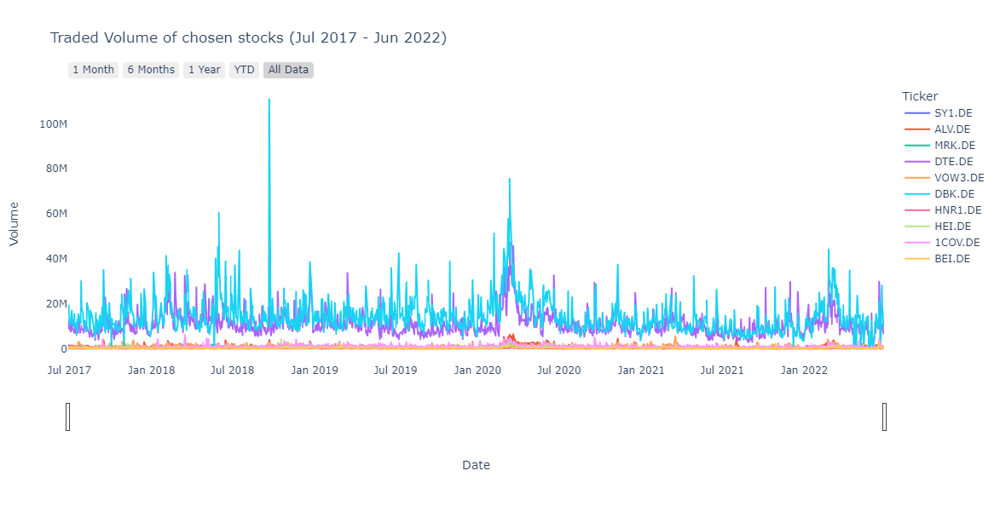

In [7]:
# Creating the basic line chart
fig = px.line(df, 
              x = 'Date',
              y = 'Volume',
              color = 'Ticker',
              labels = {'x': 'Date', 'y': 'Traded Volume'}, 
              title = 'Traded Volume of chosen stocks (Jul 2017 - Jun 2022)',
              width = 1000,
              height = 600)

# Updating layout to reduce clutter
fig.update_layout(yaxis = default_yaxis, autosize = True, plot_bgcolor = 'white')

# Creating slider
fig.update_xaxes(rangeslider_visible = True, rangeselector = default_RgSlct)

# Showing the visualization
fig.show()

The plot of traded volume shows a totally opposite image to that of the price plot. It can be seen that `DBK.DE` and `DTE.DE` have high traded volume compared to those of others over the considered period. It seems to be the case that stocks whose prices are low have high traded volume, so it would be better if the daily total traded value is investigated, but this data is not available. 

Fortunately, a proxy for this data can be constructed and used to get more insight about it. Since we have data about `High` and `Low` prices of a stock as well as the traded `Volume` of the trading days, a proxy for the daily traded value can be calculated using the following formula 

$$\text{Traded Value} \approx \frac{1}{2}\times(\text{High} + \text{Low}) \times \text{Volume}$$

This data is illustrated in the following plot.

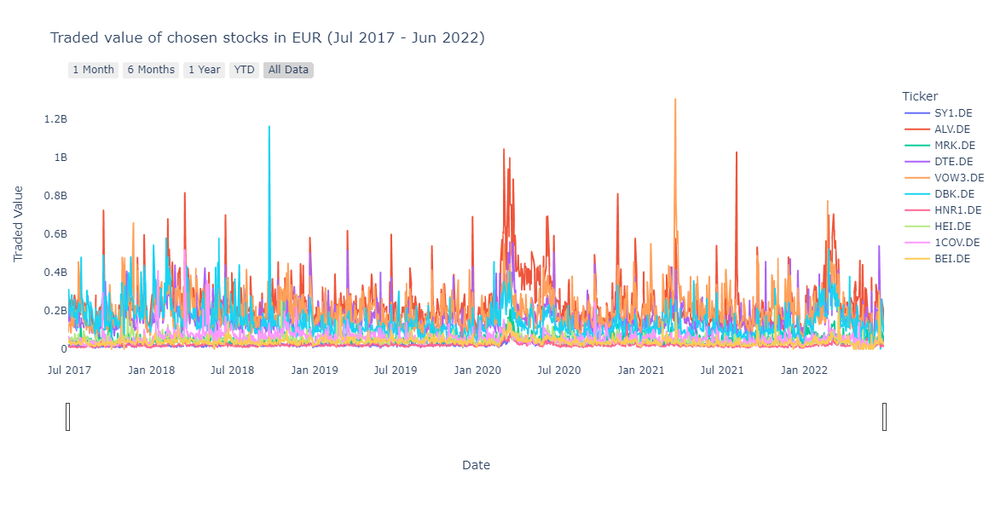

In [8]:
# Calculating the traded value using the formula above
df['Traded Value'] = 0.5 * (df.High + df.Low) * df.Volume

# Creating the basic line chart
fig = px.line(df, 
              x = 'Date',
              y = 'Traded Value',
              color = 'Ticker',
              title = 'Traded value of chosen stocks in EUR (Jul 2017 - Jun 2022)',
              width = 1000,
              height = 600)

# Updating layout to reduce clutter
fig.update_layout(yaxis = default_yaxis, autosize = True, plot_bgcolor = 'white')

# Creating slider
fig.update_xaxes(rangeslider_visible = True, rangeselector = default_RgSlct)

# Showing the visualization
fig.show()

The illustration now shows a clearer view of the changes among the stocks. Visually speaking, the changes in traded value of `ALV.DE`, `VOW3.DE`, and `BDK.DE` seem to have many spikes over the considered period. This phenomenon might be caused either by the sudden changes in one the stock price or in traded volume. Let us have a deeper look at the summarized statistics of these stocks

In [9]:
# Listing the columns to show
r_show = [('Open', 'count'),
          ('Open', 'mean'),
          ('Open', 'std'),
          ('Open', 'mean/std'),
          ('Volume', 'mean'),
          ('Volume', 'std'),
          ('Volume', 'mean/std'),
          ('Traded Value', 'mean'),
          ('Traded Value', 'std'),
          ('Traded Value', 'mean/std')]

# Creating summary statistics for chosen variables
tab_sum1 = df.loc[:, ['Open', 'Volume', 'Traded Value', 'Ticker']].groupby('Ticker').describe()

# Calculating `mean/std`
tab_sum1[('Open', 'mean/std')] = tab_sum1[('Open', 'mean')] / tab_sum1[('Open', 'std')]
tab_sum1[('Volume', 'mean/std')] = tab_sum1[('Volume', 'mean')] / tab_sum1[('Volume', 'std')]
tab_sum1[('Traded Value', 'mean/std')] = tab_sum1[('Traded Value', 'mean')] / tab_sum1[('Traded Value', 'std')]

# Showing sorted results
tab_sum1 = tab_sum1.loc[:, r_show]
tab_sum1.sort_values(by = [('Traded Value', 'mean')], ascending = False)

Open                                    Volume                 \
             count     mean     std mean/std            mean            std   
Ticker                                                                        
ALV.DE  1,268.0000 195.9094 17.1550  11.4200  1,234,959.0726   702,663.7348   
VOW3.DE 1,268.0000 160.5898 26.3272   6.0998  1,246,523.7240   599,780.2028   
DTE.DE  1,268.0000  15.2874  1.3982  10.9336 11,036,654.7626 5,414,675.0686   
DBK.DE  1,268.0000   9.9029  2.7057   3.6600 14,553,537.1491 8,131,983.2105   
1COV.DE 1,268.0000  54.7616 15.9841   3.4260  1,145,047.6601   680,003.6839   
MRK.DE  1,268.0000 121.6767 39.1691   3.1064    483,637.3778   246,255.1722   
HEI.DE  1,268.0000  66.4163 12.3248   5.3888    773,029.8604   395,742.2731   
BEI.DE  1,268.0000  96.2652  6.2116  15.4976    394,496.2429   235,102.5830   
SY1.DE  1,268.0000  91.1997 19.3209   4.7203    282,146.9606   146,474.4901   
HNR1.DE 1,268.0000 136.8233 20.9603   6.5277    152,241.8675    89,515.4769   

                     Traded Value                            
        mean/std             mean              std mean/std  
Ticker                                                       
ALV.DE    1.7575 236,806,477.0144 120,640,343.5833   1.9629  
VOW3.DE   2.0783 197,841,817.5991  99,784,517.4007   1.9827  
DTE.DE    2.0383 165,840,174.8011  75,651,554.0899   2.1922  
DBK.DE    1.7897 140,744,673.5562  82,965,723.6908   1.6964  
1COV.DE   1.6839  58,916,163.4940  35,387,583.9680   1.6649  
MRK.DE    1.9640  55,105,627.2274  25,301,075.3868   2.1780  
HEI.DE    1.9534  49,452,505.0395  21,673,552.6223   2.2817  
BEI.DE    1.6780  37,681,767.0158  21,338,037.4809   1.7659  
SY1.DE    1.9263  25,581,089.6025  14,734,240.0513   1.7362  
HNR1.DE   1.7007  20,469,877.0361  12,171,915.3281   1.6817

I added some calculated columns regarded as `mean/std`. This metric can be used to compare the volatility of a statistics of many stocks (bigger is better). It can be seen from the summary table that `ALV.DE`, `DBK.DE`, `DTE.DE`, and `VOW3.DE` are the stocks that have very high traded value throughout the considered period. This result is similar to the what has been observed visually from the previous visualizations. 

The statistics of `Open` and `Volume` might provide insights into the source of the volatilities in the `Traded Value` of these stocks. By comparing the `mean/std` metrics of `Open` and `Volume`, we can see which source of volatility is stronger than the other. For example, for `ALV.DE`, the main source of volatility in `Traded Value` comes from the volatility in `Volume` as its `mean/std` metric is much lower than that of `Open`, which indicates that the changes in its `Volume` are more volatile. Using the same logic, the volatility sources of `VOW3.DE`, `DTE.DE`, and `DBK.DE` respectively come from their `Volume`, `Price`, and `Volume`.

It should be noted that I have to choose 6 stocks out of the 10 presented to form a portfolio, which means that I have to choose 4 comparatively worst stocks to eliminate. Hence it is necessary to acknowledge the fact that `HNR1.DE`, `SY1.DE`, `BEI.DE`, and `HEI.DE` are the stocks that have the lowest `Traded Value` as summarized by the table. This information is useful for my final decision.

It is also important to make a look to the trends of the stock that I am interested in over time, this can be presented to some visualization of the smoothed data by taking the moving average (MA) of a certain windows. From the analysis so far I am interested in `DTE.DE` as I know that its changes in Volume is driven mainly by the changes in `Price`.

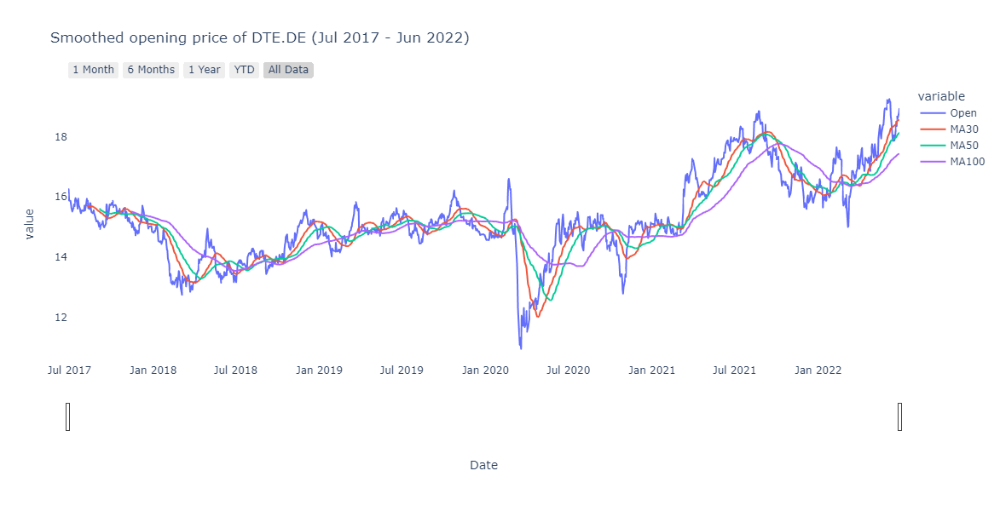

In [10]:
# Extracting data of `DTE.DE`
df_smooth = df[df.Ticker == 'DTE.DE']

# Calculating moving average
df_smooth['MA30'] = df_smooth.Open.rolling(30).mean()
df_smooth['MA50'] = df_smooth.Open.rolling(50).mean()
df_smooth['MA100'] = df_smooth.Open.rolling(100).mean()

# Creating the basic line chart
fig = px.line(df_smooth, 
              x = 'Date',
              y = ['Open', 'MA30', 'MA50', 'MA100'],
              title = 'Smoothed opening price of DTE.DE (Jul 2017 - Jun 2022)',
              width = 1000,
              height = 600)

# Updating layout to reduce clutter
fig.update_layout(yaxis = default_yaxis, autosize = True, plot_bgcolor = 'white')

# Creating slider
fig.update_xaxes(rangeslider_visible = True, rangeselector = default_RgSlct)

# Showing the visualization
fig.show()

Different rolling windows offer different smoothing lines and seem to ignore information to different degrees. The `MA100` price neglects lots of volatility in the price so the trend is strongly smoothed. The `MA30` and `MA50` lines are closer to the actualy trend in data as the smoothing effect is not as strong as that of `MA100`. The choice of the smoothing windows is really contextually dependent, so it is up to the analyst to decide.

### Volatility analysis

Raw price data is affected by the autocorrelation of prices across days. Such autocorrelations create many noises when studying the bivariate movements of any two stocks, so percentage changes are used instead to eliminate this effect. For daily data, the daily percentage change on a particular day $t$ for a stock is denoted as $r_t$ and calculated from the closing prices $p_t$ and $p_{t-1}$ using the following formula

$$r_t = \frac{p_t}{p_{t-1}} - 1$$

The daily percentage changes of the chosen stocks are calculated and presented in the table below

In [11]:
# Filtering columns
c_show = ['Date', 'Adj Close', 'Ticker']

# Reshaping data
df_closingP = df.loc[:, c_show]
df_closingP = df_closingP.pivot(index = 'Date', columns = 'Ticker', values = 'Adj Close')

# Calculating daily percentage changes
df_returns = df_closingP.pct_change()

# Final result
df_returns

Ticker,1COV.DE,ALV.DE,BEI.DE,DBK.DE,DTE.DE,HEI.DE,HNR1.DE,MRK.DE,SY1.DE,VOW3.DE
Date,,,,,,,,,,
2017-06-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-29,-0.0483,-0.0072,-0.0322,0.0054,-0.0209,-0.0030,-0.0005,-0.0217,-0.0075,-0.0100
2017-06-30,-0.0035,-0.0040,0.0002,-0.0190,-0.0116,-0.0053,-0.0005,-0.0005,-0.0039,0.0026
2017-07-03,0.0079,0.0203,-0.0027,0.0367,0.0067,0.0250,0.0114,-0.0071,0.0074,0.0184
2017-07-04,-0.0138,0.0043,-0.0038,0.0186,-0.0095,0.0040,0.0047,-0.0090,-0.0069,0.0029
...,...,...,...,...,...,...,...,...,...,...
2022-06-22,-0.0548,-0.0070,0.0125,-0.0015,0.0171,-0.0091,-0.0145,-0.0095,0.0104,-0.0142
2022-06-23,-0.0302,-0.0263,0.0149,-0.1219,-0.0004,-0.0306,-0.0331,-0.0067,0.0005,-0.0370
2022-06-24,0.0414,0.0123,0.0134,0.0478,0.0119,0.0193,0.0419,0.0557,0.0422,0.0009


The summary statistics of these stocks can be calculated easily by using the `describe()` method of the Pandas DataFrame. I also modify this table a bit so that it is more convenient to investigate the statistics.

In [12]:
tab_sum2 = df_returns.describe().T.sort_values(by = 'std', ascending = False)
tab_sum2

,count,mean,std,min,25%,50%,75%,max
Ticker,,,,,,,,
DBK.DE,"1,267.0000",-0.0001,0.0260,-0.1844,-0.0125,-0.0002,0.0136,0.1290
VOW3.DE,"1,267.0000",0.0004,0.0226,-0.1521,-0.0107,-0.0001,0.0104,0.1905
1COV.DE,"1,267.0000",-0.0001,0.0214,-0.1556,-0.0114,0.0002,0.0118,0.0887
HEI.DE,"1,267.0000",-0.0001,0.0193,-0.1424,-0.0088,0.0000,0.0087,0.1146
HNR1.DE,"1,267.0000",0.0004,0.0165,-0.1779,-0.0062,0.0007,0.0079,0.1707
ALV.DE,"1,267.0000",0.0004,0.0161,-0.1533,-0.0062,0.0005,0.0070,0.1580
MRK.DE,"1,267.0000",0.0005,0.0157,-0.0922,-0.0073,0.0005,0.0090,0.1012
SY1.DE,"1,267.0000",0.0006,0.0142,-0.1001,-0.0064,0.0005,0.0082,0.1034
BEI.DE,"1,267.0000",0.0001,0.0131,-0.0981,-0.0058,0.0000,0.0068,0.0756


`mean` and `std` are the two important metrics that characterize each stock. When investigating a stock, `mean` daily percentage change is the return that an investor could expect to get from investing in it for a day, so it is regarded as expected return of the stock, $E[r_t]$ or $\mu$. `std` is the standard deviation of the daily return $\sigma$, it shows the average deviation that the actual return deviate from the expected return. The larger `std` is, the higher or lower the actual return might deviates from the expected return, so it is used to present the risk in the return of the stock. It should be noted that `mean` values in the table above is very small, but these are expected daily returns. When these returns compound over 365 days of the year, the equivalent annual returns would be much higher.

One way to compare these stocks by their characteristics is to use the Sharpe ratio. Without a given risk-free rate, the Sharpe ratio of each stock can be calculated by the following formula

$$S_X = \frac{\mu_X}{\sigma_X}$$

where $S_X, \mu_X, \text{ and } \sigma_X$ are respectively the Sharpe ratio, expected return, and risk of the stock $X$. The Sharpe ratios of these stocks are calculated simply as follows.

In [13]:
tab_sum2['S'] = tab_sum2['mean']/tab_sum2['std']
tab_sum2.sort_values(by = 'S')

,count,mean,std,min,25%,50%,75%,max,S
Ticker,,,,,,,,,
HEI.DE,"1,267.0000",-0.0001,0.0193,-0.1424,-0.0088,0.0000,0.0087,0.1146,-0.0044
1COV.DE,"1,267.0000",-0.0001,0.0214,-0.1556,-0.0114,0.0002,0.0118,0.0887,-0.0030
DBK.DE,"1,267.0000",-0.0001,0.0260,-0.1844,-0.0125,-0.0002,0.0136,0.1290,-0.0029
BEI.DE,"1,267.0000",0.0001,0.0131,-0.0981,-0.0058,0.0000,0.0068,0.0756,0.0106
VOW3.DE,"1,267.0000",0.0004,0.0226,-0.1521,-0.0107,-0.0001,0.0104,0.1905,0.0188
ALV.DE,"1,267.0000",0.0004,0.0161,-0.1533,-0.0062,0.0005,0.0070,0.1580,0.0224
HNR1.DE,"1,267.0000",0.0004,0.0165,-0.1779,-0.0062,0.0007,0.0079,0.1707,0.0246
DTE.DE,"1,267.0000",0.0004,0.0127,-0.1066,-0.0056,0.0000,0.0069,0.0652,0.0323
MRK.DE,"1,267.0000",0.0005,0.0157,-0.0922,-0.0073,0.0005,0.0090,0.1012,0.0324


The Sharpe ratios show that `HEI.DE`, `1COV.DE`, `DBK.DE`, and `BEI.DE` are the least attractive stock to invest in.

Next, let us confirm these insights by investigating the visualizations of stock returns. The changes in daily percentage returns overtime of these stocks are plotted below.

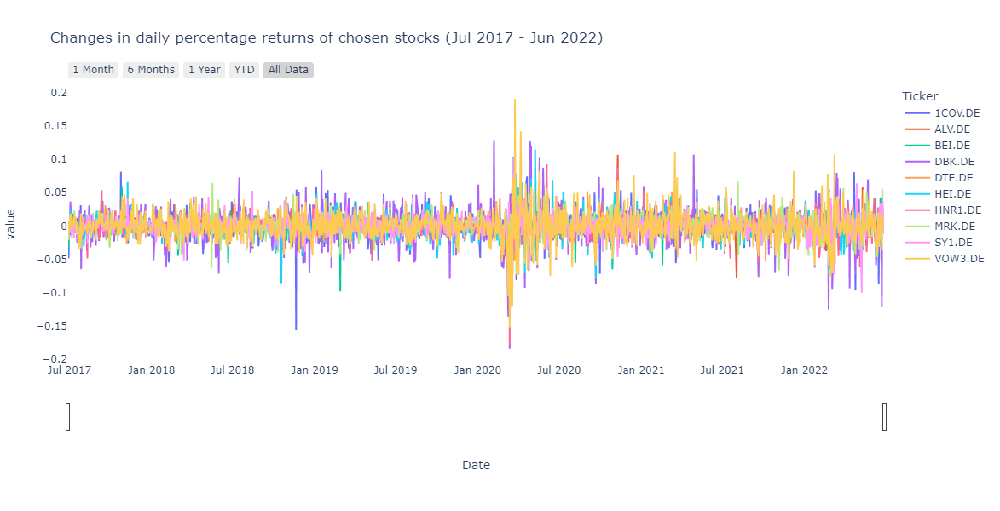

In [14]:
# Creating the basic line chart
fig = px.line(df_returns, 
              x = df_returns.index,
              y = df_returns.columns,
              title = 'Changes in daily percentage returns of chosen stocks (Jul 2017 - Jun 2022)',
              width = 1000,
              height = 600)

# Updating layout to reduce clutter
fig.update_layout(yaxis = default_yaxis, autosize = True, plot_bgcolor = 'white')

# Creating slider
fig.update_xaxes(rangeslider_visible = True, rangeselector = default_RgSlct)

# Showing the visualization
fig.show()

We can see how these stocks volatile during the last 5 years. For a clearer insight, we can look at the box plots of the daily percentage changes.

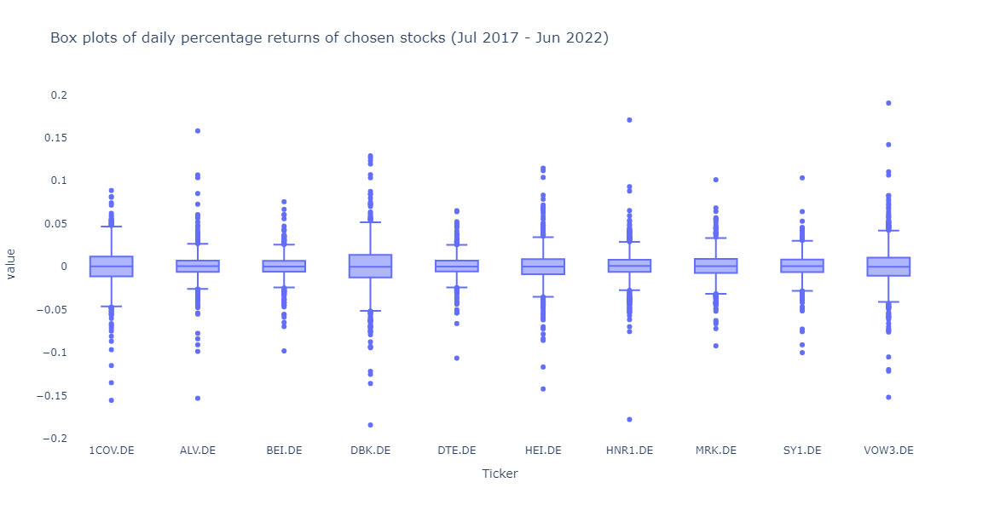

In [15]:
# Simple box plots
fig = px.box(df_returns,
             title = 'Box plots of daily percentage returns of chosen stocks (Jul 2017 - Jun 2022)',
             width = 1000,
             height = 600,)

# Updating layout to reduce clutter
fig.update_layout(yaxis = default_yaxis, autosize = True, plot_bgcolor = 'white')

# Showing the visualization
fig.show()

The box plots show a clearer picture of the highly volatiled stocks. Visually speaking, `1COV.DE`, `DBK.DE`, `HEI.DE`, and `VOW3.DE` are highly volatiled. This insight is quite similar to what has been learned from the price analysis and the table of summary statistics.

When choosing stocks for my portfolio, I would like to know which stock returns will move together so that I could diversify the risk of the portfolio. This information is given by a correlation matrix.

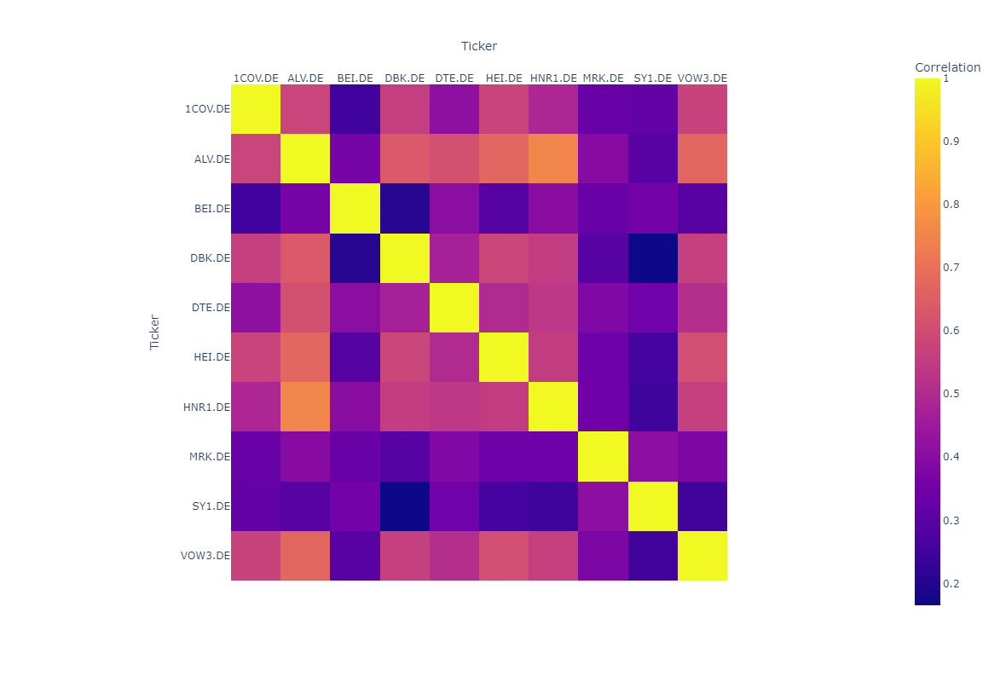

In [16]:
# Simple correlation heat map
fig = px.imshow(df_returns.corr(),
                labels = dict(color = 'Correlation'),
                width = 800,
                height = 800)

# Adding color scale
fig.update_xaxes(side = 'top')

# Showing visualization
fig.show()

It can be seen from the correlation matrix that the chosen stocks are all positively correlated to each other. However, the correlation varies depending on which pair of stocks is being considered. A scatter matrix plot is useful to have a more clear insight to these correlations.

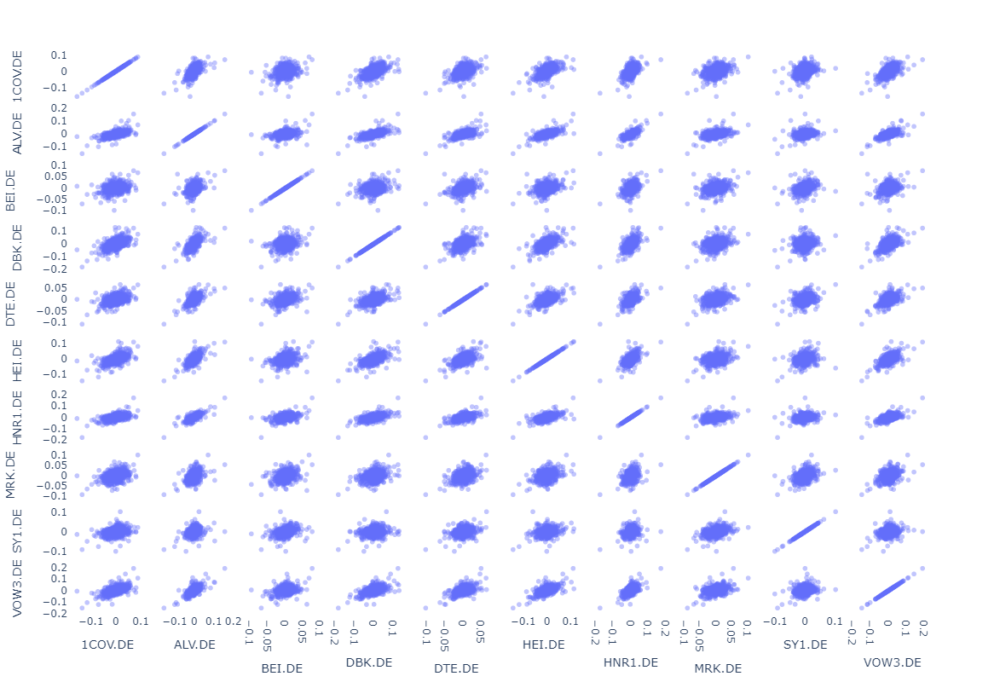

In [17]:
# Simple scatter matrix
fig = px.scatter_matrix(df_returns,
                        opacity = 0.4,
                        width = 800,
                        height = 800)

# Updating layout to reduce clutter
fig.update_layout(yaxis = default_yaxis, autosize = True, plot_bgcolor = 'white')

# Showing the visualization
fig.show()

The correlation matrix shows that `BEI.DE`, `MRK.DE`, and `SY1.DE` seem to be the least correlated with other stocks. They are in the list of stocks that have the lowest daily average `Traded Value` as discussed above. 

### Cumulative returns

The cumulative return of a stock answer a more practical question. Suppose that I want to invest in a stock for a certain period and the stock does not pay dividend, then I would like to know how much I would get from the increase in the stock price afer the investment period I would like to have. In this case, the investment period is five years. Denoting the initial stock price as $p_t$ then the change in price of the stock between the period $t$ and $t + k$ is 

$$
p_{t+k} = \Pi^r_{j = 1} (1 + r_j) \times p_t
$$

which means the final price is the initial price compouned by the returns over the chosen period and the cumulative return is $\Pi^r_{j = 1} (1 + r_j)$. The cummulative returns of the chosen stocks are calculated as follows

In [18]:
df_cumR = (1 + df_returns).cumprod()
df_cumR

Ticker,1COV.DE,ALV.DE,BEI.DE,DBK.DE,DTE.DE,HEI.DE,HNR1.DE,MRK.DE,SY1.DE,VOW3.DE
Date,,,,,,,,,,
2017-06-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-29,0.9517,0.9928,0.9678,1.0054,0.9791,0.9970,0.9995,0.9783,0.9925,0.9900
2017-06-30,0.9484,0.9888,0.9680,0.9863,0.9677,0.9917,0.9990,0.9778,0.9887,0.9926
2017-07-03,0.9559,1.0089,0.9654,1.0226,0.9741,1.0165,1.0105,0.9709,0.9960,1.0108
2017-07-04,0.9427,1.0132,0.9617,1.0416,0.9649,1.0206,1.0152,0.9621,0.9892,1.0138
...,...,...,...,...,...,...,...,...,...,...
2022-06-22,0.6833,1.3440,1.0405,0.6469,1.4857,0.7155,1.3902,1.5636,1.7263,1.2720
2022-06-23,0.6627,1.3086,1.0560,0.5680,1.4851,0.6936,1.3442,1.5531,1.7271,1.2250
2022-06-24,0.6901,1.3247,1.0702,0.5952,1.5027,0.7070,1.4005,1.6397,1.8000,1.2260


The changes of cumulative returns over time are visualized in the following multiple line plot.

In [19]:
# Creating the basic line chart
fig = px.line(df_cumR, 
              x = df_cumR.index,
              y = df_cumR.columns,
              title = 'Changes in cumulative returns of chosen stocks (Jul 2017 - Jun 2022)',
              width = 1000,
              height = 600)

# Updating layout to reduce clutter
fig.update_layout(yaxis = default_yaxis, autosize = True, plot_bgcolor = 'white')
fig.add_hline(y = 1, line_dash = "dash", opacity = 0.5, annotation_text = "Break Even", annotation_position = "bottom right")

# Creating slider
fig.update_xaxes(rangeslider_visible = True, rangeselector = default_RgSlct)

# Showing the visualization
fig.show()

The cumulative returns plot shows the most and least profitable stocks over a 5-year period. It can be seen clearly from the plot that `DBK.DE`, `HEI.DE`, `1COV.DE`, and `BEI.DE` have the worst performance in terms of cumulative returns.

## Conclusion

In this project, I demonstrate my familiarity with `Pandas` and `Plotly` by constructing a stock analysis in Python using these packages. This stock analysis can be regarded as a technical analysis as it studies the patterns in the stocks' historical data. In a hypothetical scenario, I want to choose six out of ten stocks taken from the DAX30 Index to form a portfolio, this is just arbitrary so I will not discuss this choice in too much details. The analysis focuses on the trend in stock prices, volatility in their returns, and cumulative returns of the chosen stocks.

The list of chosen stocks are given in Table 1, the analysis results show that, out of ten chosen stocks:

* `HNR1.DE`, `SY1.DE`, `BEI.DE`, `HEI.DE` have lowest average daily traded value
* `HEI.DE`, `1COV.DE`, `DBK.DE`, `BEI.DE` have lowest Sharpe ratio 
* `BEI.DE`, `MRK.DE`, `SY1.DE1` are least correlated to other stocks
* `DBK.DE`, `HEI.DE`, `1COV.DE`, `BEI.DE` have the lowest cumulative returns

Based on these insights, I choose to discard `HEI.DE`, `BEI.DE`, `1COV.DE`, and `SY1.DE`. The decision is made based on the frequency of appearance in these categories, and these stock all have appeared at least twice. In conclusion, the list of chosen stocks for forming the portfolio is given in the table below

| Symbol  | Company Name                                | Last Price | Change | % Change | Volume     |
| ------- | ------------------------------------------- | ---------- | ------ | -------- | ---------- |
| ALV.DE  | Allianz SE                                  | 181.04     | \-0.16 | \-0.09%  | 1,069,053  |
| MRK.DE  | MERCK Kommanditgesellschaft auf Aktien      | 165.1      | 0.3    | 0.18%    | 313,644    |
| DTE.DE  | Deutsche Telekom AG                         | 18.84      | \-0.04 | \-0.20%  | 6,880,550  |
| VOW3.DE | Volkswagen AG                               | 138.88     | \-0.3  | \-0.22%  | 913,070    |
| DBK.DE  | Deutsche Bank Aktiengesellschaft            | 8.89       | \-0.03 | \-0.33%  | 10,112,593 |
| HNR1.DE | Hannover Rück SE                            | 136.4      | \-0.45 | \-0.33%  | 95,892     |

**Table 2**: Chosen stocks by the analysis results (source: [Yahoo! Finance](https://finance.yahoo.com/quote/%5EGDAXI/components?p=%5EGDAXI), accessed on June 27, 2022)

This is by no means the optimal way to study or choose the proper stocks to invest in, as there might be other more efficient and practical ways to do this. Such a hypothetical scenario is mostly useful for understanding the employed tools so that they can be effectively utilized in more realistics situations.